**K-Fold ?????**\
**Leave one out validation**\
**AIC, BIC**

In [1]:
import numpy as np
import pandas as pd

In [2]:
#!jupyter nbextension enable ipympl --py --sys-prefix
#!jupyter nbextension install --py --symlink --sys-prefix ipympl

In [3]:
from matplotlib import pyplot as plt
import seaborn as sns

In [4]:
#%config InlineBackend.figure_format = 'svg' 
from pylab import rcParams
#rcParams['figure.figsize'] = 8, 5

In [5]:
df = pd.read_csv('train.csv')

In [6]:
df['date_time'] = pd.to_datetime(df['date_time'])

Split 'date_time' into 'day' and 'hour' columns

In [7]:
df["day"] = df["date_time"].dt.day
df["hour"] = df["date_time"].dt.hour
df.head()

,date_time,deg_C,relative_humidity,absolute_humidity,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,target_carbon_monoxide,target_benzene,target_nitrogen_oxides,day,hour
0,2010-03-10 18:00:00,13.1,46.0,0.7578,1387.2,1087.8,1056.0,1742.8,1293.4,2.5,12.0,167.7,10,18
1,2010-03-10 19:00:00,13.2,45.3,0.7255,1279.1,888.2,1197.5,1449.9,1010.9,2.1,9.9,98.9,10,19
2,2010-03-10 20:00:00,12.6,56.2,0.7502,1331.9,929.6,1060.2,1586.1,1117.0,2.2,9.2,127.1,10,20
3,2010-03-10 21:00:00,11.0,62.4,0.7867,1321.0,929.0,1102.9,1536.5,1263.2,2.2,9.7,177.2,10,21
4,2010-03-10 22:00:00,11.9,59.0,0.7888,1272.0,852.7,1180.9,1415.5,1132.2,1.5,6.4,121.8,10,22


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7111 entries, 0 to 7110
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   date_time               7111 non-null   datetime64[ns]
 1   deg_C                   7111 non-null   float64       
 2   relative_humidity       7111 non-null   float64       
 3   absolute_humidity       7111 non-null   float64       
 4   sensor_1                7111 non-null   float64       
 5   sensor_2                7111 non-null   float64       
 6   sensor_3                7111 non-null   float64       
 7   sensor_4                7111 non-null   float64       
 8   sensor_5                7111 non-null   float64       
 9   target_carbon_monoxide  7111 non-null   float64       
 10  target_benzene          7111 non-null   float64       
 11  target_nitrogen_oxides  7111 non-null   float64       
 12  day                     7111 non-null   int64   

In [9]:
targets = ['target_carbon_monoxide', 'target_benzene', 'target_nitrogen_oxides']

Add 'season' column

In [10]:
seasons = ['spring', 'summer', 'autumn', 'winter']

In [11]:
def season(date):
    x = date.month
    if x in [12,1,2]:
        return 'winter'
    elif x in [3,4,5]:
        return 'spring'
    elif x in [6,7,8]:
        return 'summer'
    elif x in [9,10,11]:
        return 'autumn'

In [12]:
df['season'] = df['date_time'].apply(season)

In [13]:
df.head()

,date_time,deg_C,relative_humidity,absolute_humidity,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,target_carbon_monoxide,target_benzene,target_nitrogen_oxides,day,hour,season
0,2010-03-10 18:00:00,13.1,46.0,0.7578,1387.2,1087.8,1056.0,1742.8,1293.4,2.5,12.0,167.7,10,18,spring
1,2010-03-10 19:00:00,13.2,45.3,0.7255,1279.1,888.2,1197.5,1449.9,1010.9,2.1,9.9,98.9,10,19,spring
2,2010-03-10 20:00:00,12.6,56.2,0.7502,1331.9,929.6,1060.2,1586.1,1117.0,2.2,9.2,127.1,10,20,spring
3,2010-03-10 21:00:00,11.0,62.4,0.7867,1321.0,929.0,1102.9,1536.5,1263.2,2.2,9.7,177.2,10,21,spring
4,2010-03-10 22:00:00,11.9,59.0,0.7888,1272.0,852.7,1180.9,1415.5,1132.2,1.5,6.4,121.8,10,22,spring


In [14]:
df.describe()

,deg_C,relative_humidity,absolute_humidity,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,target_carbon_monoxide,target_benzene,target_nitrogen_oxides,day,hour
count,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000,7111.000000
mean,20.878034,47.561004,1.110309,1091.572100,938.064970,883.903305,1513.238349,998.335565,2.086219,10.237083,204.066784,16.144705,11.505977
std,7.937917,17.398731,0.398950,218.537554,281.978988,310.456355,350.180310,381.537695,1.447109,7.694426,193.927723,8.758778,6.925721
min,1.300000,8.900000,0.198800,620.300000,364.000000,310.600000,552.900000,242.700000,0.100000,0.100000,1.900000,1.000000,0.000000
25%,14.900000,33.700000,0.855900,930.250000,734.900000,681.050000,1320.350000,722.850000,1.000000,4.500000,76.450000,9.000000,6.000000
50%,20.700000,47.300000,1.083500,1060.500000,914.200000,827.800000,1513.100000,928.700000,1.700000,8.500000,141.000000,16.000000,12.000000
75%,25.800000,60.800000,1.404150,1215.800000,1124.100000,1008.850000,1720.400000,1224.700000,2.800000,14.200000,260.000000,24.000000,18.000000
max,46.100000,90.800000,2.231000,2088.300000,2302.600000,2567.400000,2913.800000,2594.600000,12.500000,63.700000,1472.300000,31.000000,23.000000


In [15]:
df.columns

Index(['date_time', 'deg_C', 'relative_humidity', 'absolute_humidity',
       'sensor_1', 'sensor_2', 'sensor_3', 'sensor_4', 'sensor_5',
       'target_carbon_monoxide', 'target_benzene', 'target_nitrogen_oxides',
       'day', 'hour', 'season'],
      dtype='object')

In [16]:
columns = list(df.columns)
columns

['date_time',
 'deg_C',
 'relative_humidity',
 'absolute_humidity',
 'sensor_1',
 'sensor_2',
 'sensor_3',
 'sensor_4',
 'sensor_5',
 'target_carbon_monoxide',
 'target_benzene',
 'target_nitrogen_oxides',
 'day',
 'hour',
 'season']

In [17]:
sensors = [ 'sensor_1', 'sensor_2', 'sensor_3', 'sensor_4', 'sensor_5']

Logarithmic sensors distributions

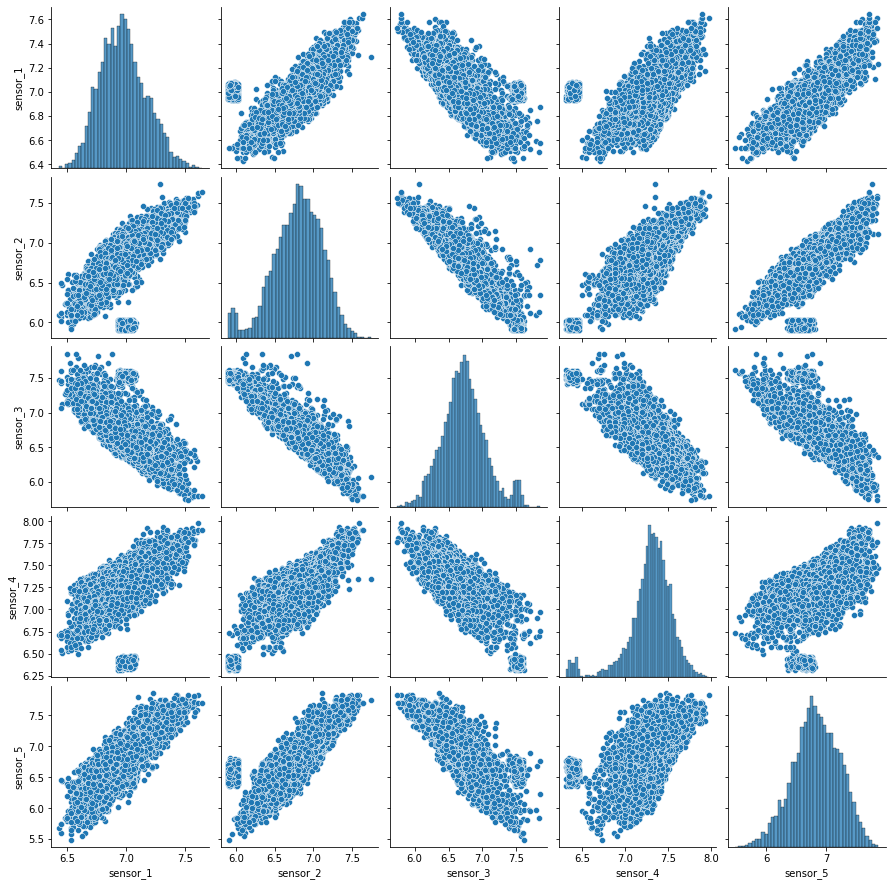

In [18]:
sns.pairplot(df[sensors].apply(np.log))

In [19]:
#norm_df = (df[sensors] - df[sensors].mean())/(df[sensors].max() - df[sensors].min())

In [20]:
#sns.pairplot(norm_df)

<AxesSubplot:>

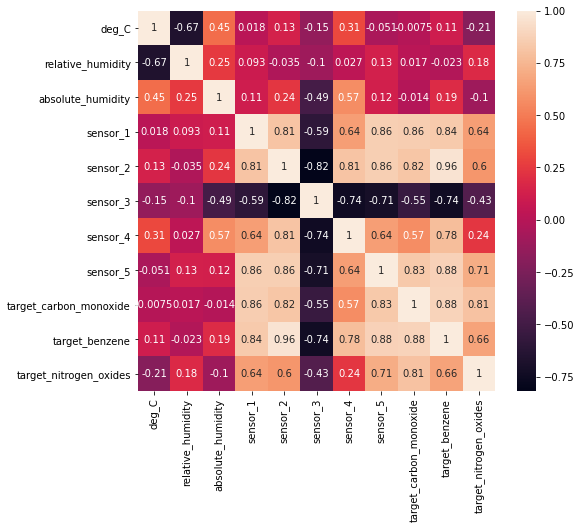

In [21]:
plt.rcParams['figure.figsize'] = 8,7
sns.heatmap(df.iloc[:,1:-3].corr(), annot = True)

In [22]:
def PCA(X, normalize = False):
    x_mean = np.mean(X,axis = 0)
    x_std = 1
    if normalize == True:
        x_std = np.std(X,axis = 0)
    S = np.dot(((X - x_mean)/x_std).T,(X - x_mean)/x_std)/(X.shape[0] - 1)
    U,Sigma,V = np.linalg.svd(S)
    return np.dot(X,U[:,:2]),np.dot(X,U[:,:3])

In [23]:
X = df.iloc[:,1:-3].to_numpy()

In [24]:
from mpl_toolkits.mplot3d import Axes3D

In [25]:
#%matplotlib widget
%matplotlib inline

PCA for sensors

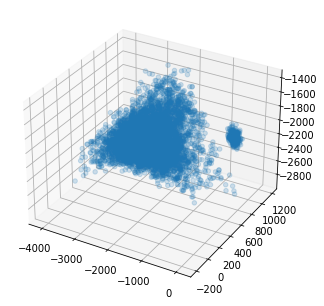

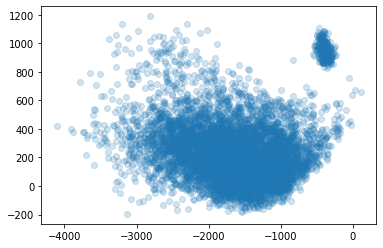

In [26]:
X_sensors = df[sensors] #.apply(np.log)
X2, X3 = PCA(X_sensors)
fig = plt.figure()
ax = Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(ax)
ax.scatter(X3[:,0],X3[:,1],X3[:,2],alpha = 0.2)
plt.show()
plt.scatter(x = X2[:,0], y = X2[:,1],alpha = 0.2)
plt.show()

### Distributions
Distributions for dataset after normalization

In [27]:
df_normalize = (df.iloc[:,1:-3] - df.iloc[:,1:-3].mean())/(df.iloc[:,1:-3].max() - df.iloc[:,1:-3].min())

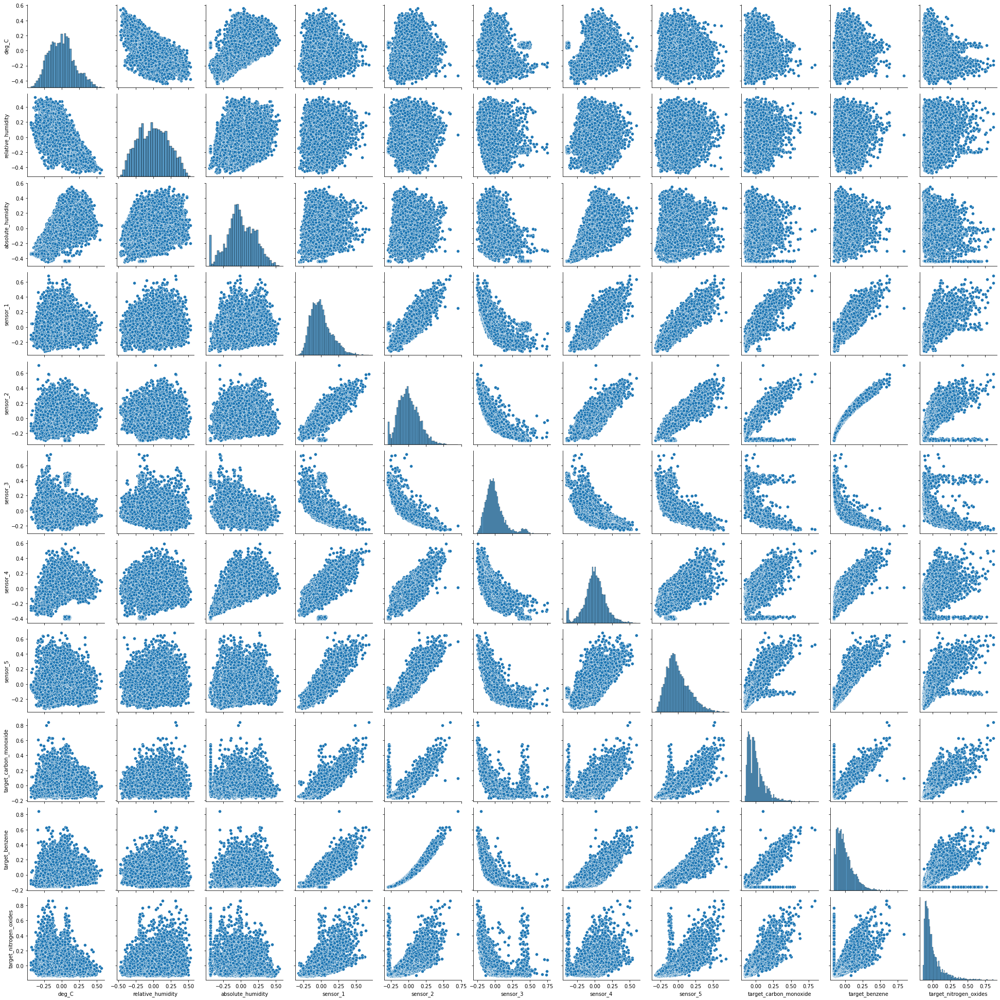

In [28]:
sns.pairplot(df_normalize)

Distributions with respect for seasons

In [29]:
df_normalize[columns[-3:]] = df[columns[-3:]]

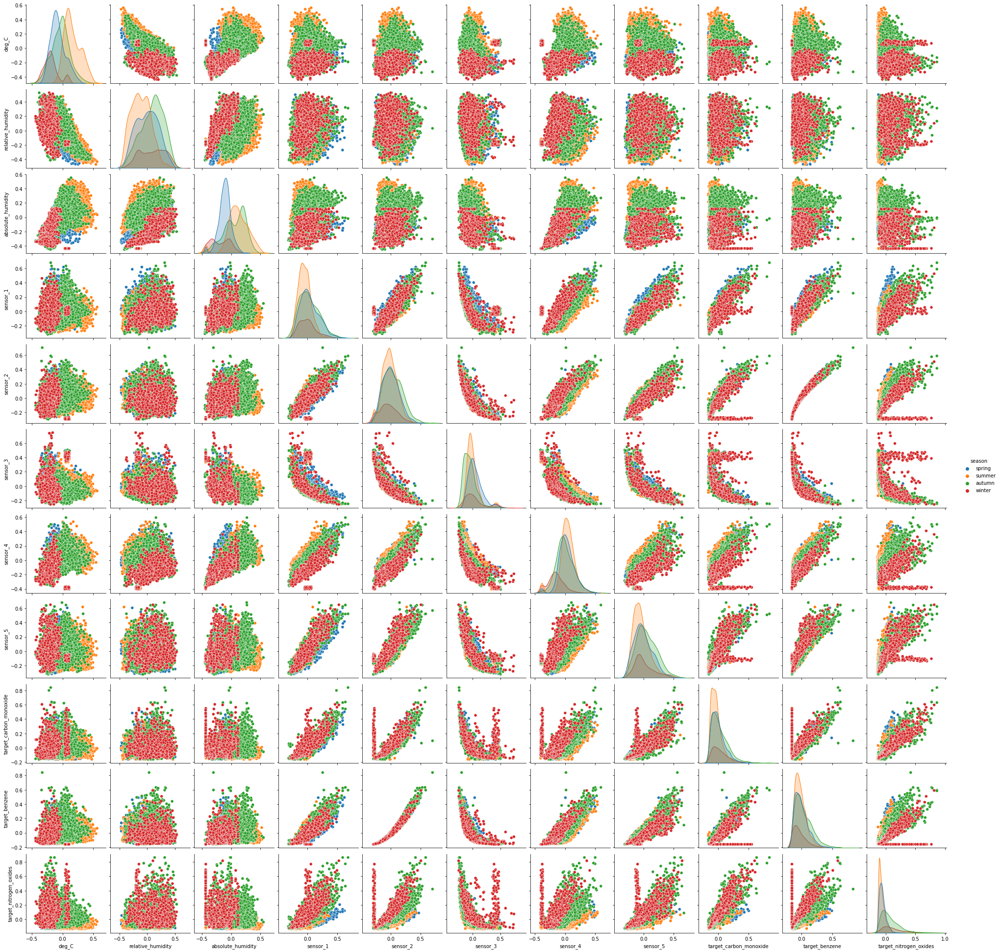

In [30]:
sns.pairplot(df_normalize[columns[1:-3] + ['season']], hue = 'season')

Search for outliers with boxplots

<AxesSubplot:>

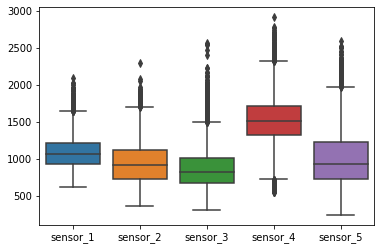

In [31]:
sns.boxplot(data = df[sensors])

deg_C


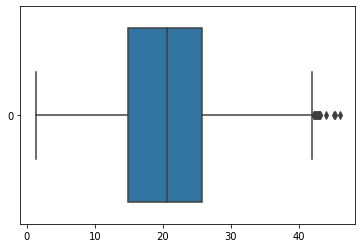

relative_humidity


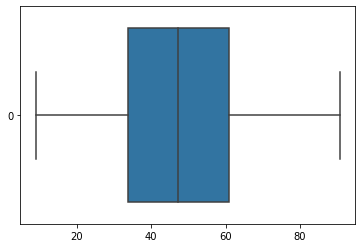

absolute_humidity


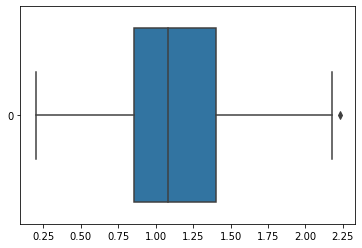

target_carbon_monoxide


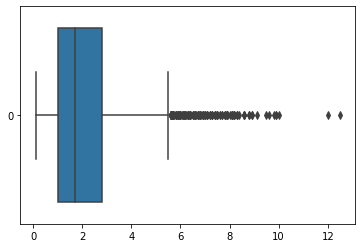

target_benzene


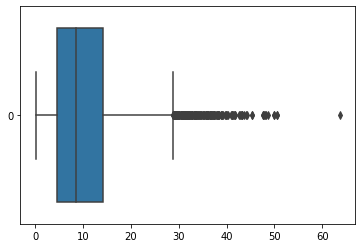

target_nitrogen_oxides


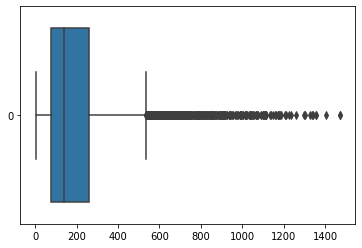

In [32]:
for col in [col for col in columns[1: -3] if col not in sensors]:
    sns.boxplot(data = df[col], orient = 'h')
    print(col)
    plt.show()


In [33]:
outliers = {}
for col in columns[1:-3]:
    Q1, Q3 = np.percentile(df[col], [25, 75])
    IQR = Q3 - Q1
    outliers[col] = [Q1 - 1.5*IQR, Q3 + 1.5*IQR]


In [34]:
outliers

{'deg_C': [-1.450000000000001, 42.150000000000006],
 'relative_humidity': [-6.949999999999989, 101.44999999999999],
 'absolute_humidity': [0.033524999999999916, 2.226525],
 'sensor_1': [501.92500000000007, 1644.125],
 'sensor_2': [151.10000000000036, 1707.8999999999996],
 'sensor_3': [189.35000000000002, 1500.5499999999997],
 'sensor_4': [720.2749999999996, 2320.4750000000004],
 'sensor_5': [-29.924999999999955, 1977.4749999999997],
 'target_carbon_monoxide': [-1.6999999999999997, 5.5],
 'target_benzene': [-10.049999999999999, 28.75],
 'target_nitrogen_oxides': [-198.87500000000006, 535.325]}

In [35]:
df.groupby(['season'])[['deg_C'] + sensors].mean()

,deg_C,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5
season,,,,,,
autumn,19.463049,1128.056502,1010.854579,767.312637,1503.489927,1115.915430
spring,17.538247,1139.059574,931.167984,979.317427,1567.557801,970.476545
summer,28.100906,1014.667844,900.536549,880.806386,1599.355299,892.040625
winter,12.468591,1086.716242,854.178926,982.057047,1142.658121,1042.494631


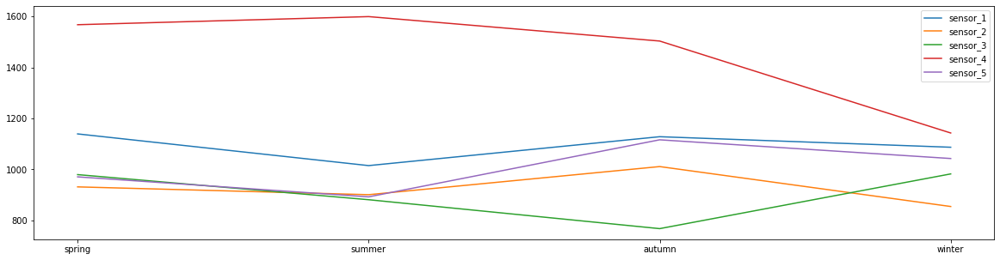

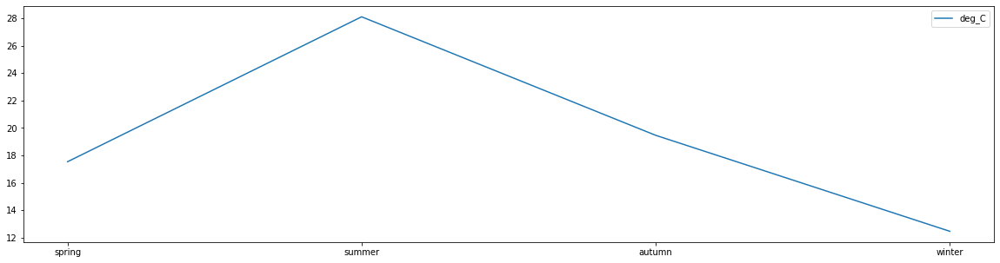

In [36]:
plt.rcParams["figure.figsize"] = 20, 5
plt.plot(seasons,df.groupby(['season'], sort = False)[sensors].mean(), label = sensors)
plt.legend()
plt.show()
plt.plot(seasons, df.groupby(['season'], sort = False)[['deg_C']].mean(), label = 'deg_C')
plt.legend()
plt.show()

Add 'month' column

In [37]:
months = {1 : 'Jan', 2 : 'Feb', 3 : 'Mar', 4 : 'Apr', 5 : 'May', 6 : 'Jun', 7 : 'Jul',
          8 : 'Aug', 9 : 'Sep', 10 : 'Oct', 11 : 'Nov', 12 : 'Dec'}

In [38]:
def month(date):
    months = {1 : 'Jan', 2 : 'Feb', 3 : 'Mar', 4 : 'Apr', 5 : 'May', 6 : 'Jun', 7 : 'Jul', 
              8 : 'Aug', 9 : 'Sep', 10 : 'Oct', 11 : 'Nov', 12 : 'Dec'}
    return months[int(date.month)]

In [39]:
df['month'] = df['date_time'].apply(month)

In [40]:
df.groupby(['month'], sort = False)[['deg_C']].mean()

,deg_C
month,
Mar,14.325294
Apr,17.000556
May,20.261022
Jun,26.231111
Jul,29.357796
Aug,28.653495
Sep,24.542222
Oct,20.387769
Nov,13.428333


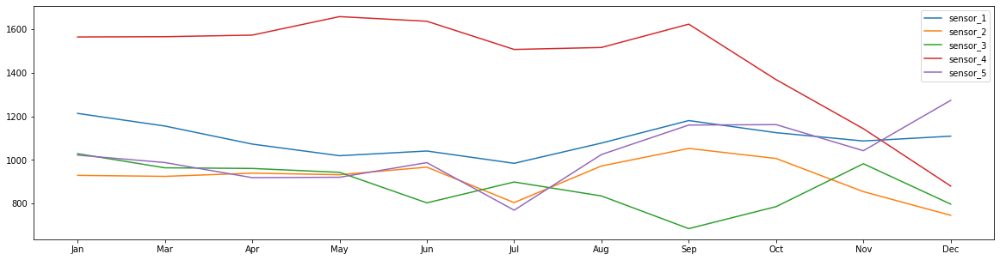

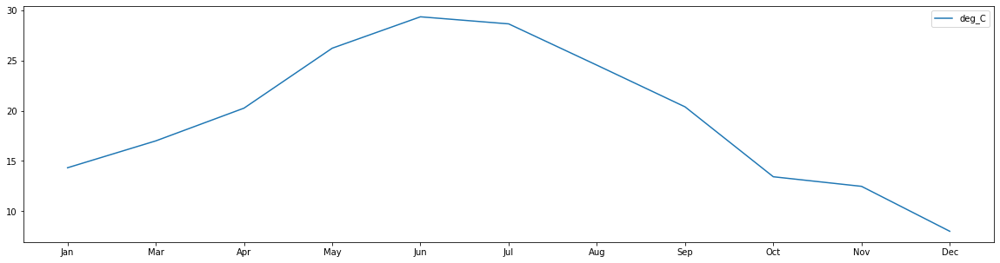

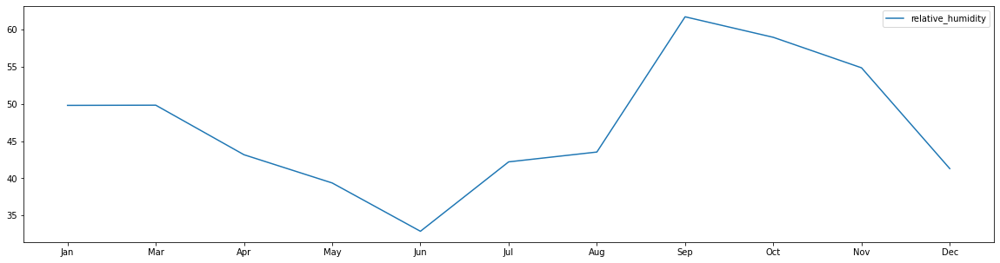

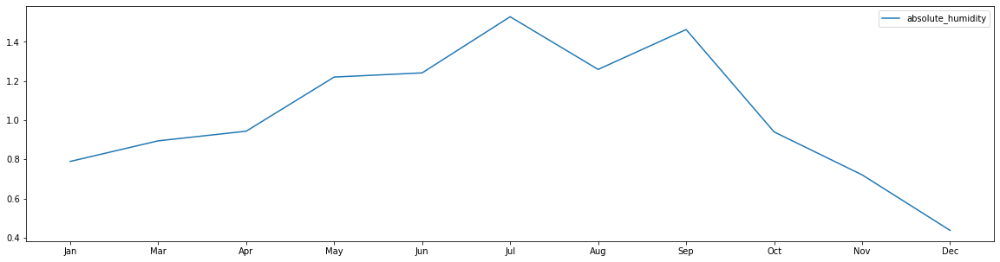

In [41]:
M = [v for v in months.values() if v != 'Feb']
plt.plot(M, df.groupby(['month'], sort = False)[sensors].mean(), label = sensors)
plt.legend()
plt.show()
plt.plot(M, df.groupby(['month'], sort = False)[['deg_C']].mean(), label = 'deg_C')
plt.legend()
plt.show()
for col in columns[2:4]: # humidity
    plt.plot(M, df.groupby(['month'], sort = False)[col].mean(), label = col)
    plt.legend()
    plt.show()

In [42]:
from statsmodels.api import tsa
from statsmodels.graphics import tsaplots

### Correlograms

c:\users\ialex\appdata\local\programs\python\python38-32\lib\site-packages\statsmodels\tsa\stattools.py:667: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(


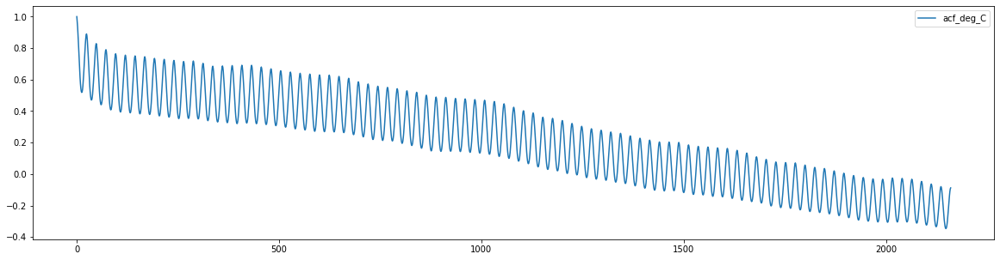

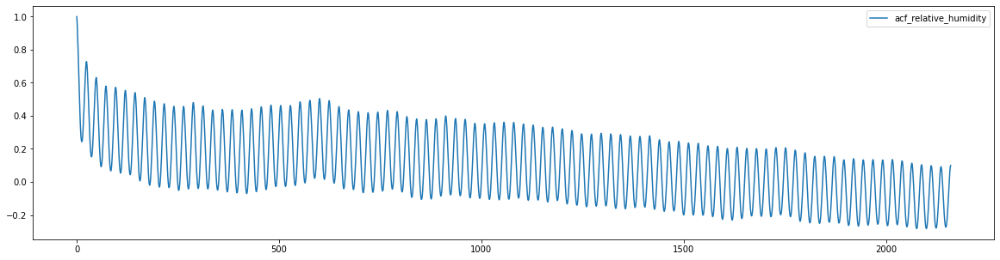

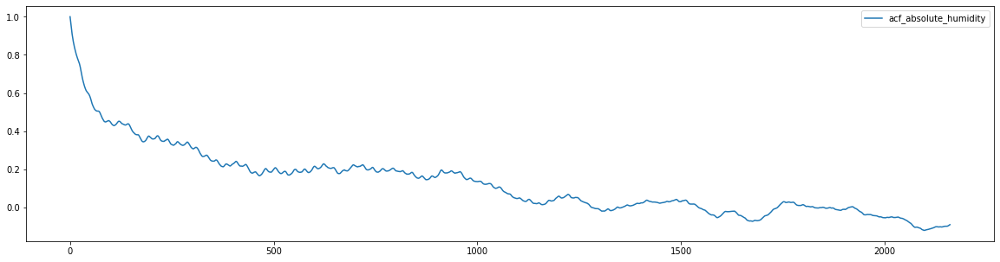

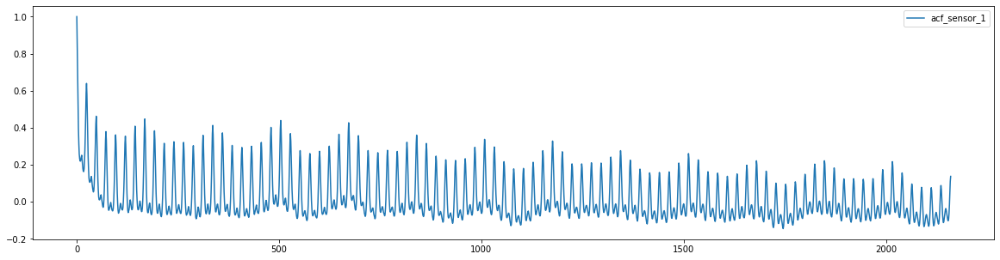

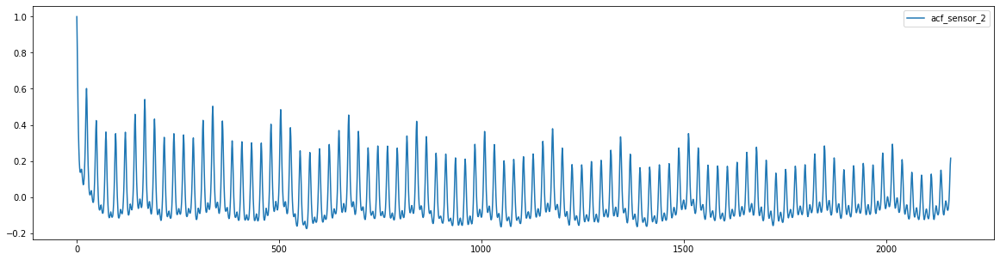

...

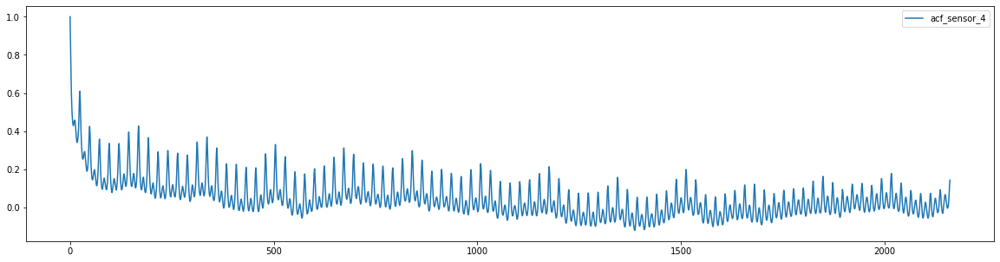

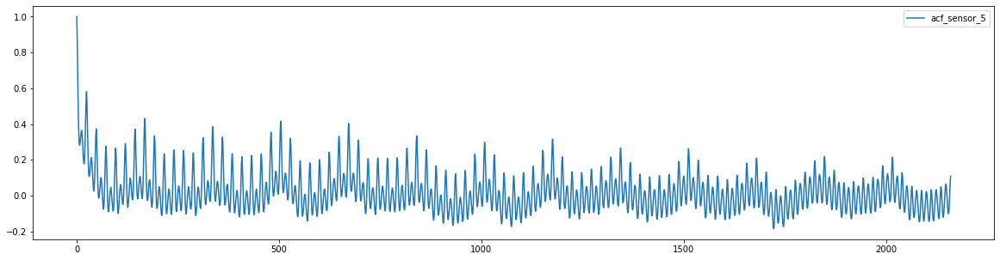

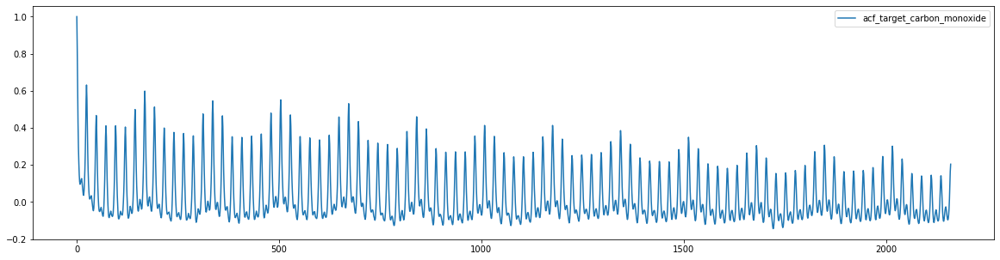

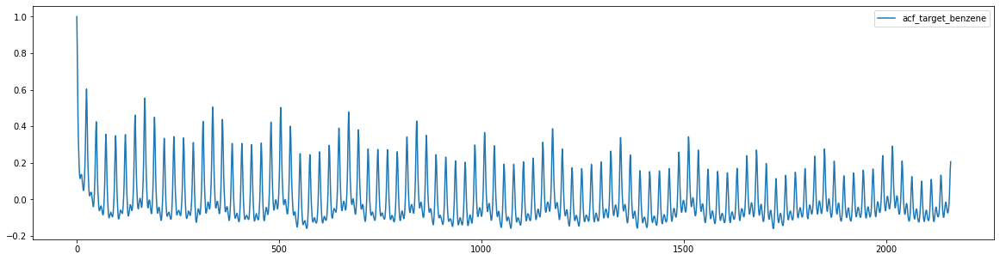

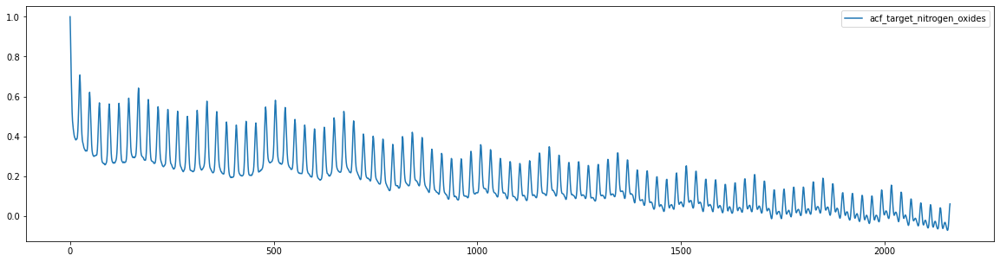

In [43]:
for col in columns[1:-3]:
    acf_df = pd.DataFrame(data = tsa.acf(df[col], nlags = 2160), index = list(range(2161)))
    plt.plot(acf_df, label = 'acf_' + col)
    plt.legend()
    plt.show()

A bit closer look at autocorrelation plots

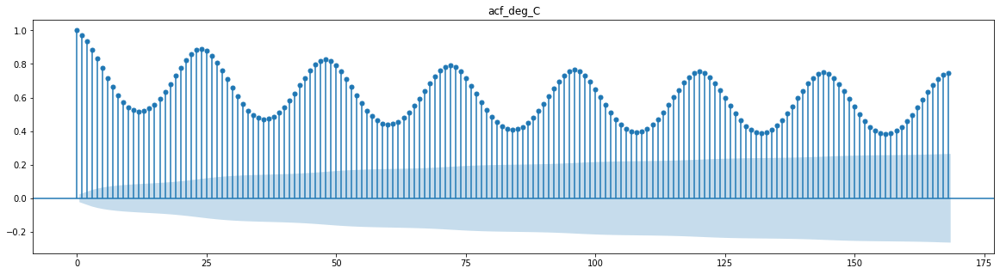

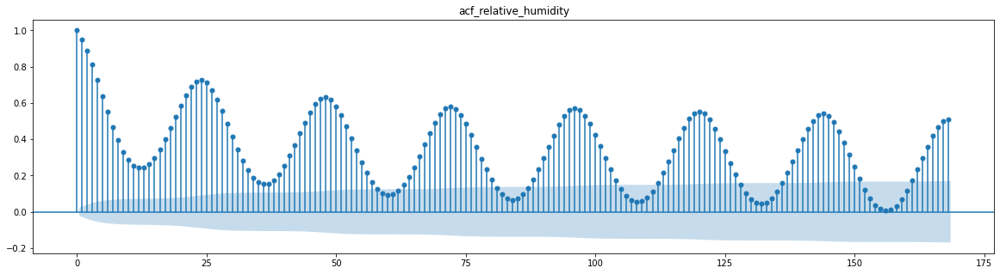

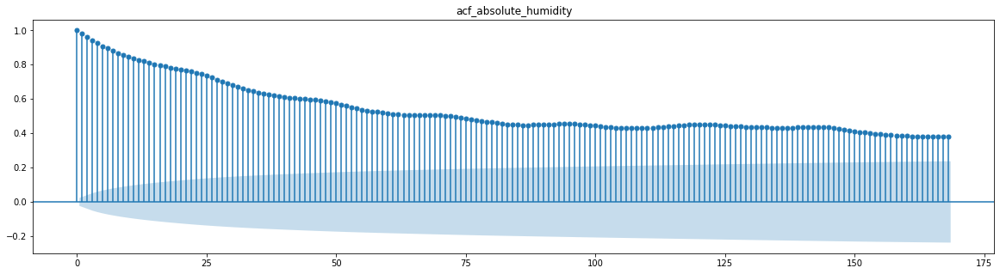

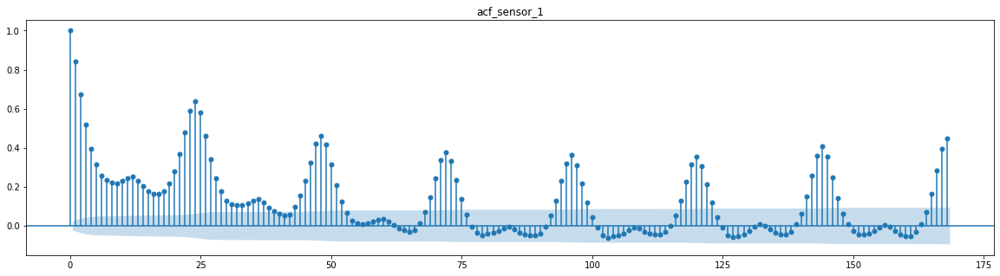

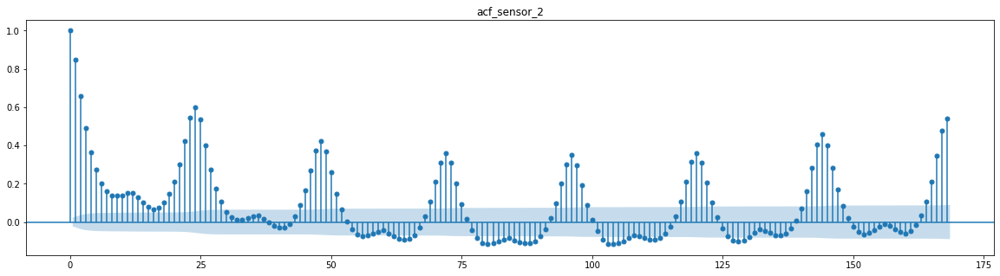

...

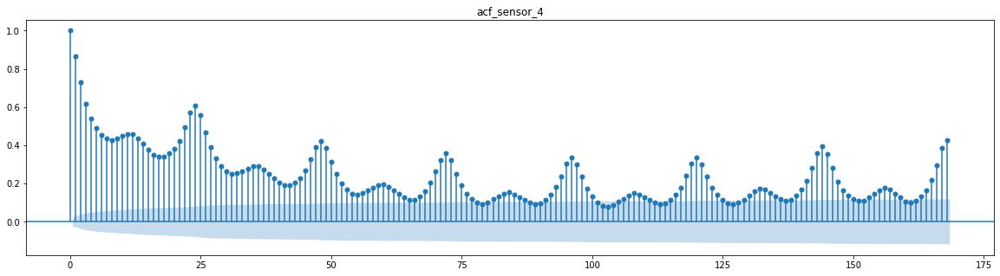

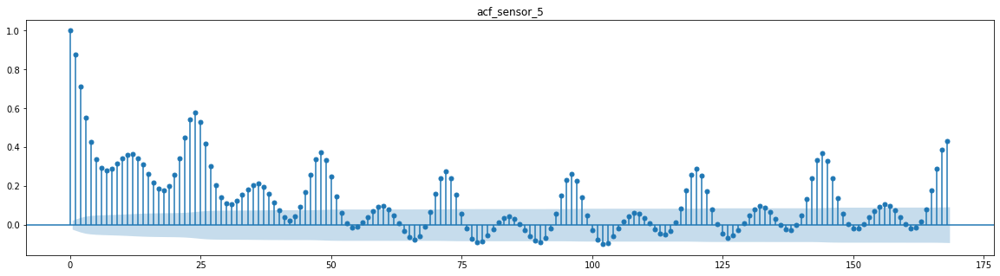

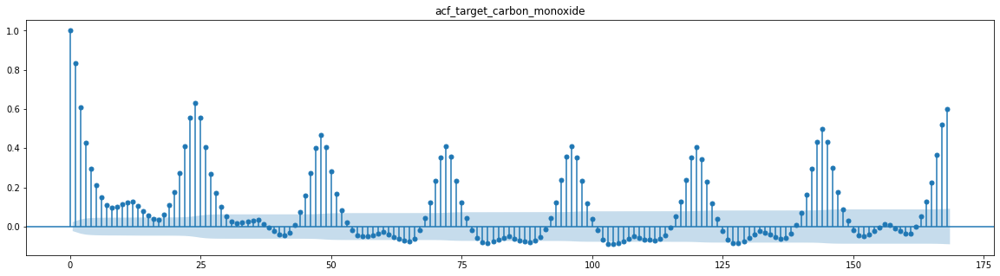

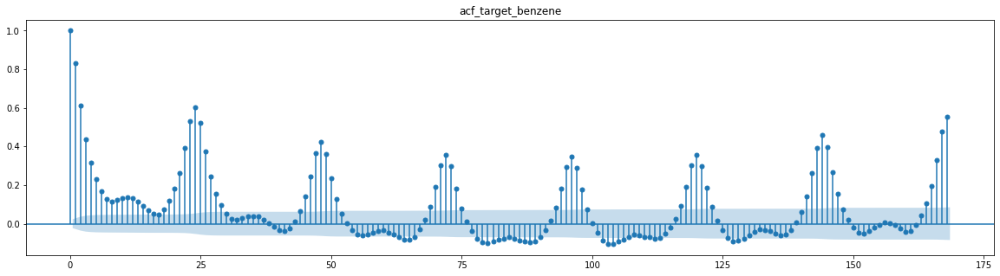

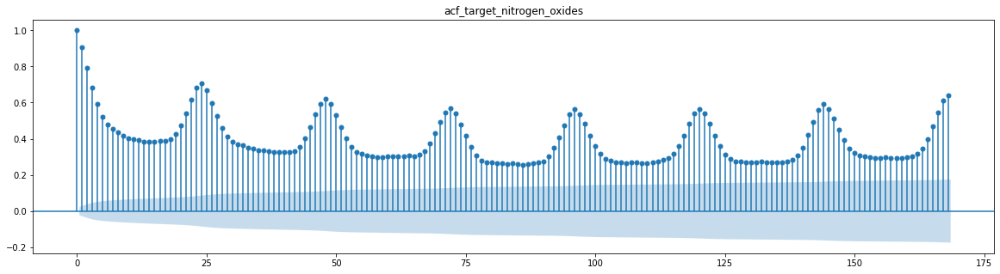

In [44]:
for col in columns[1:-3]:
    tsaplots.plot_acf(df[col],lags = 168, title = 'acf_' + col)
    plt.show()

In [45]:
from sklearn.metrics import mean_absolute_error

### Moving average (n)

In [46]:
def long_lasting_components(df, targets, n):
    LL_components = []
    
    for t in targets:
        rolling_mean = df.iloc[:,:-2].rolling(n).mean()[t]
        LL_components.append(rolling_mean)
        
    return LL_components

Let's try to catch anomalies

In [47]:
def plot_moving_average(df, targets, n, scale = 1.96):
    LL_component = long_lasting_components(df, targets, n)
    ind = 0
    for t in targets:
        plt.plot(df['date_time'], df[t], label = t)
        rolling_mean = LL_component[ind]
        plt.plot(df['date_time'],rolling_mean, label = t + f'_window_size: {n}', color = 'r')
        
        mae = mean_absolute_error(df[n:][t], rolling_mean[n:])
        deviation = np.std(df[n:][t] - rolling_mean[n:])
        
        lower_bond = rolling_mean - (mae + scale * deviation)
        upper_bond = rolling_mean + (mae + scale * deviation)
        
        plt.plot(df['date_time'],upper_bond, "r--", label="Upper Bond / Lower Bond")
        plt.plot(df['date_time'],lower_bond, "r--")
        
        anomalies = df[ np.logical_or(df[t] > upper_bond , df[t] < lower_bond) ]
        plt.plot(anomalies['date_time'], anomalies[t], 'ro')
        
        plt.legend()
        plt.show()
        
        ind += 1

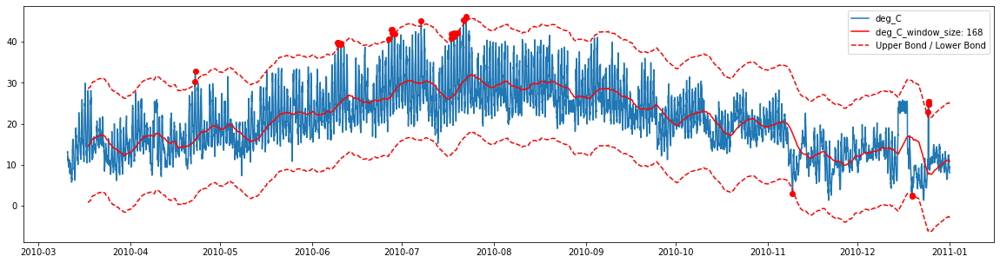

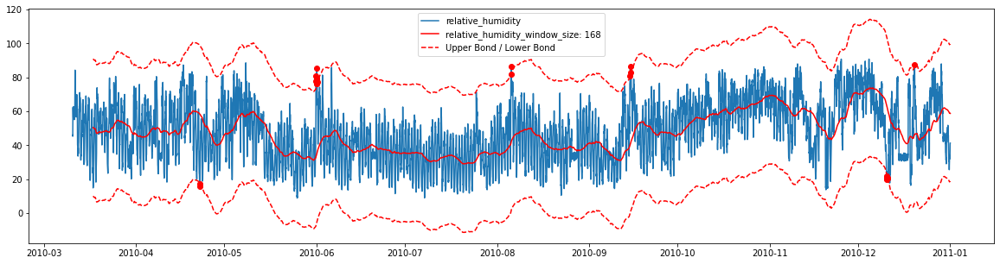

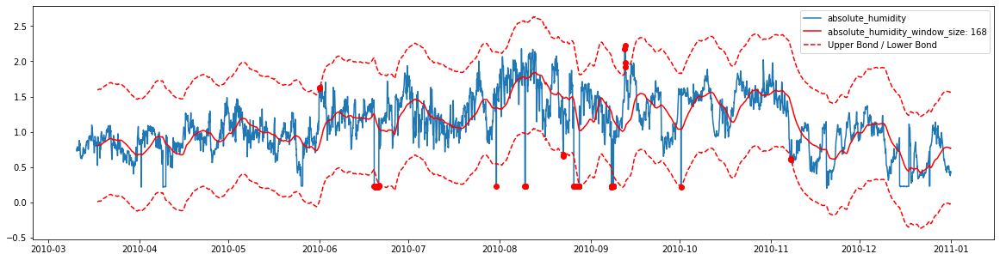

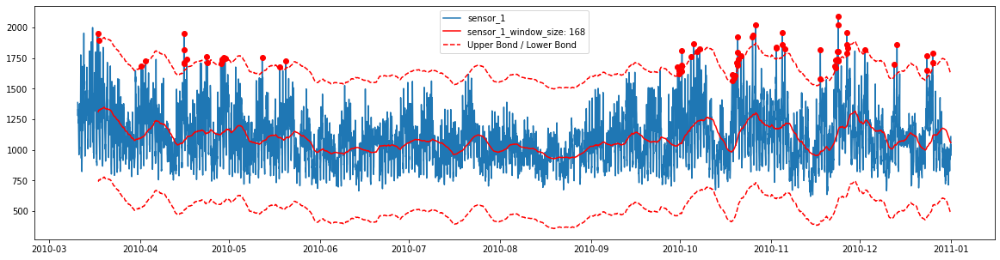

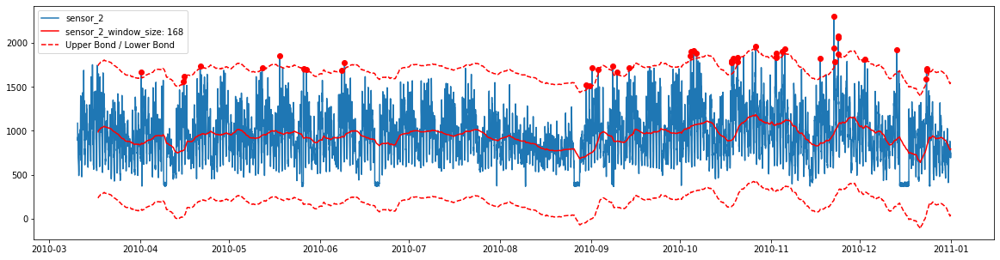

...

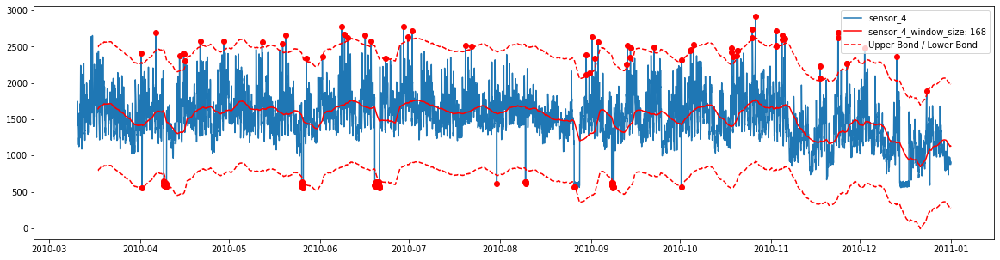

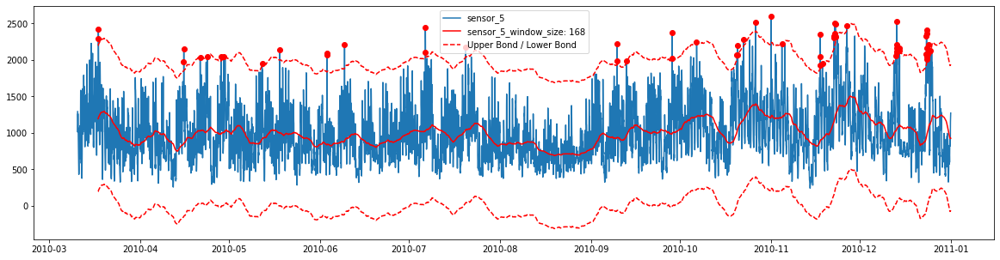

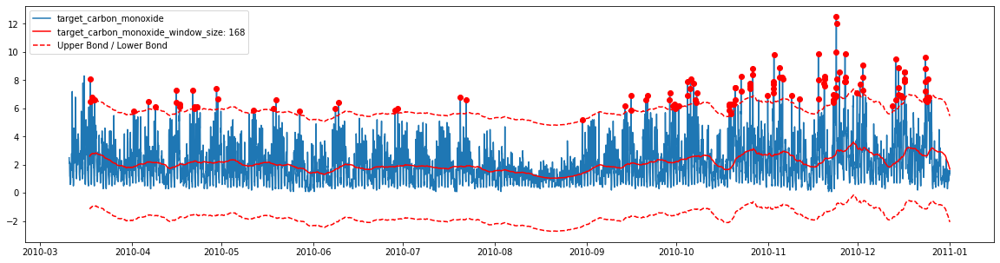

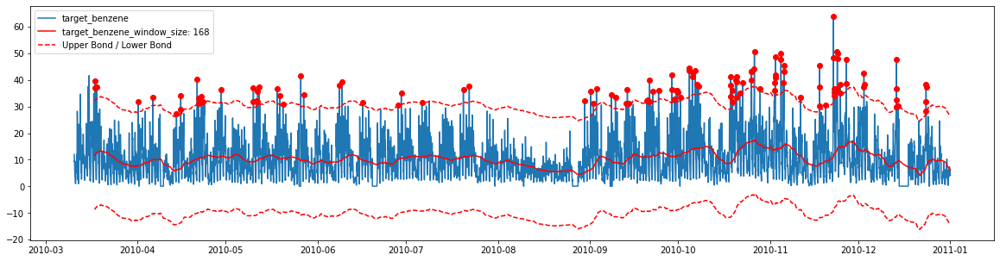

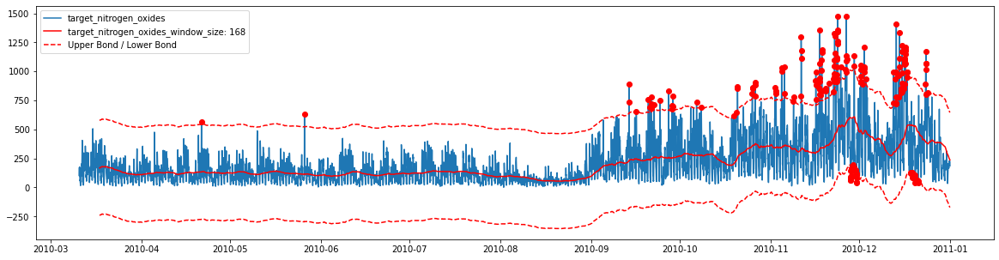

In [48]:
plot_moving_average(df = df, targets = columns[1:-3], n = 168) # 168 hours ~ 1 week

In [49]:
for col in columns[1:-3]:
    print('Dickey-Fuller test for \''  + col +' \' :', tsa.stattools.adfuller(df[col])[1])

Dickey-Fuller test for 'deg_C ' : 0.006579134583117477
Dickey-Fuller test for 'relative_humidity ' : 3.8011249632481605e-08
Dickey-Fuller test for 'absolute_humidity ' : 1.3198127519498684e-07
Dickey-Fuller test for 'sensor_1 ' : 1.4927849124697266e-12
Dickey-Fuller test for 'sensor_2 ' : 2.0508701048263683e-16
Dickey-Fuller test for 'sensor_3 ' : 1.3112768928099955e-16
Dickey-Fuller test for 'sensor_4 ' : 9.263764853940659e-12
Dickey-Fuller test for 'sensor_5 ' : 1.9313270488934272e-14
Dickey-Fuller test for 'target_carbon_monoxide ' : 7.26341357249393e-15
Dickey-Fuller test for 'target_benzene ' : 1.3715073973956577e-15
Dickey-Fuller test for 'target_nitrogen_oxides ' : 8.106358998507173e-07


In [50]:
def plot_diff(df,columns ,shift):
    
    diff_df = df[columns] - df[columns].shift(shift)
    diff_df['date_time'] = df['date_time'][shift:]
    for col in columns:
        plt.plot(df['date_time'][shift:], diff_df[col][shift:], label = col + f'_$\Delta={shift}$')
        plt.legend()
        plt.show()
    return diff_df[shift:]

trying to make them look more "stationary"

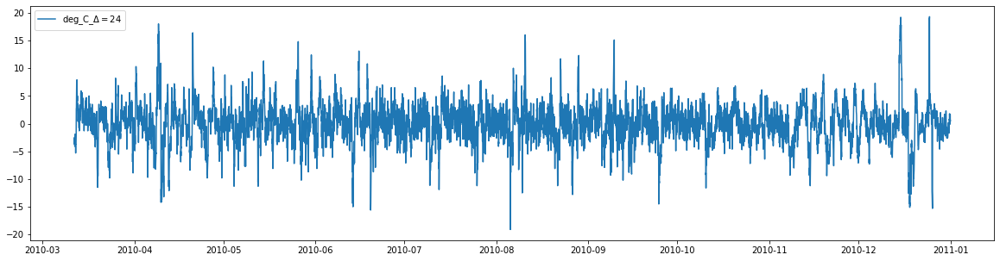

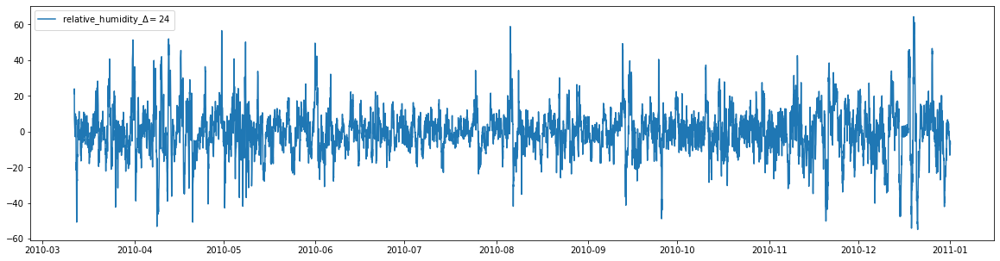

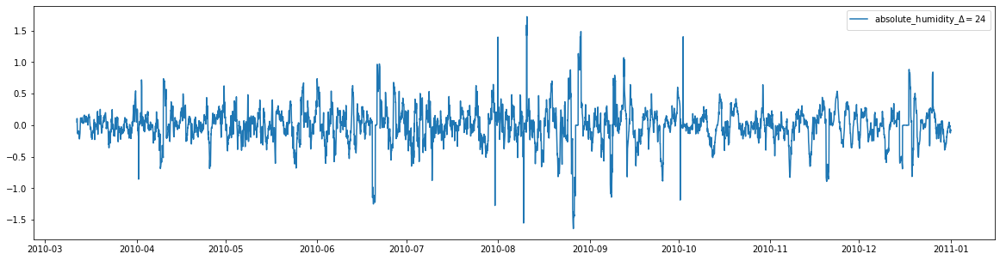

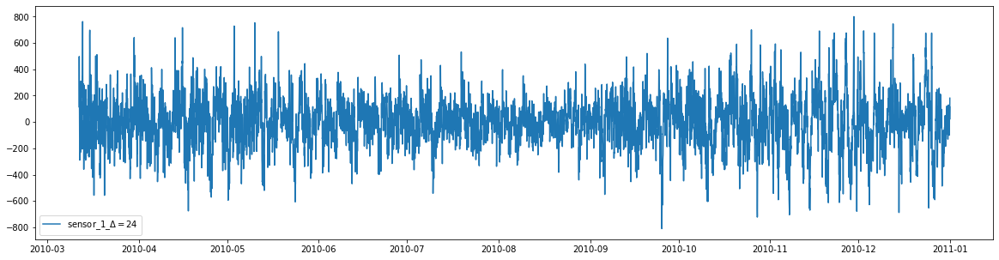

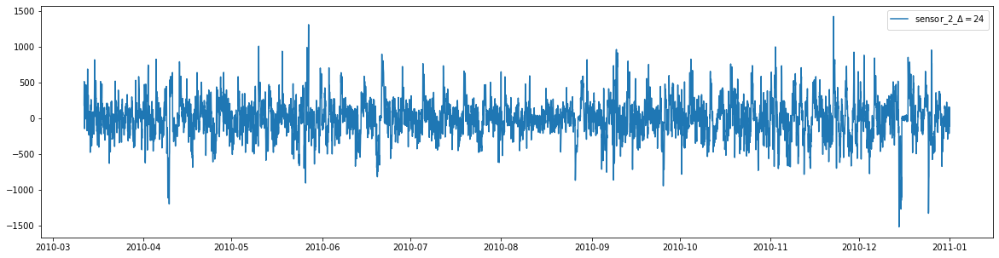

...

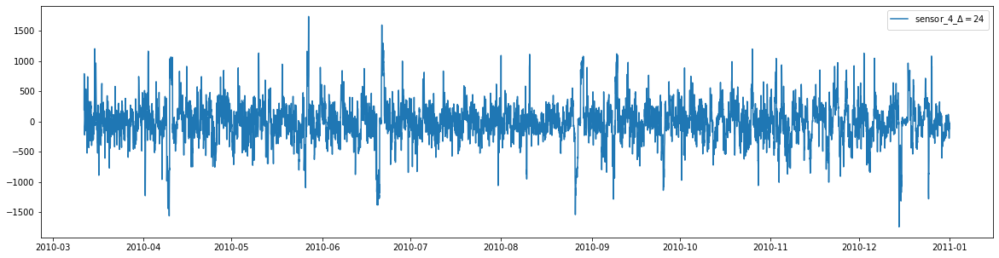

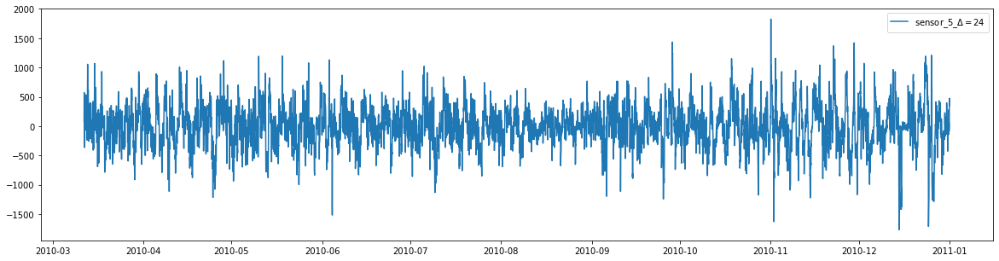

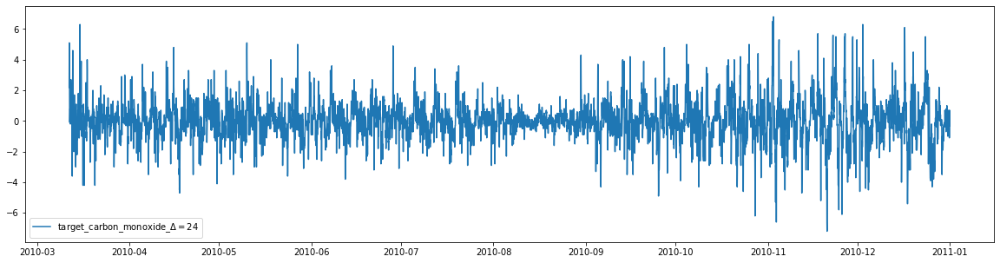

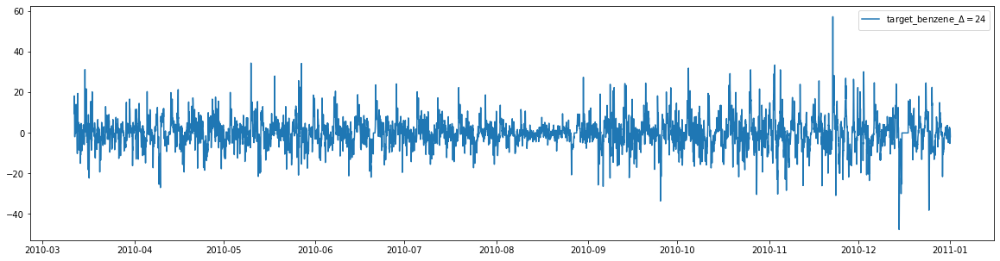

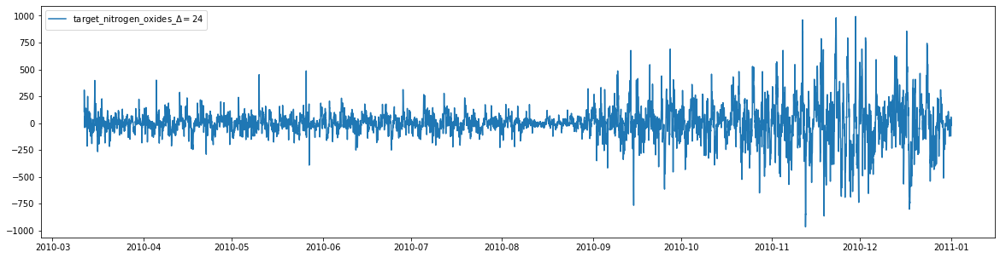

In [51]:
diff_df = plot_diff(df, columns[1:-3], 24) # lag = 24 ~ 1 day

In [52]:
for col in columns[1:-3]:
    print('Dickey-Fuller test for \''  + col +' \' :', tsa.stattools.adfuller(diff_df[col])[1])

Dickey-Fuller test for 'deg_C ' : 1.3337243863183773e-26
Dickey-Fuller test for 'relative_humidity ' : 3.599343735379264e-25
Dickey-Fuller test for 'absolute_humidity ' : 3.1705966323576935e-24
Dickey-Fuller test for 'sensor_1 ' : 7.820796120719168e-29
Dickey-Fuller test for 'sensor_2 ' : 4.624672828839036e-29
Dickey-Fuller test for 'sensor_3 ' : 1.148624117755077e-27
Dickey-Fuller test for 'sensor_4 ' : 3.773771247372361e-29
Dickey-Fuller test for 'sensor_5 ' : 1.1581034770357533e-28
Dickey-Fuller test for 'target_carbon_monoxide ' : 1.0605730732031417e-28
Dickey-Fuller test for 'target_benzene ' : 9.916693351279523e-29
Dickey-Fuller test for 'target_nitrogen_oxides ' : 4.476067487268663e-27


Merging outliers from boxplots and MA(n)

In [53]:
m = 300 # hours in one month
LL_comp = long_lasting_components(df, targets = columns[1: -3], n = m)

In [54]:
ind = 0
for col in columns[1:-3]:
    detrend_df = df[col][m:] - LL_comp[ind]
    ind += 1
    detrend_df['season'] = df['season'][m:]

In [55]:
for col in columns[1:-3]:
    df['outlier_' + col] = np.logical_or(df[col] <= outliers[col][0] , df[col] >= outliers[col][1])

In [56]:
def show_outliers(df, targets, outliers, n, scale):
    LL_component = long_lasting_components(df, targets, n)
    ind = 0
    for t in targets:
        
        plt.plot(df['date_time'], df[t], label = t)
        
        tempT_df = df[df['outlier_' + t] == True]
        plt.plot(tempT_df['date_time'], tempT_df[t],'yo', label = t + '_outlier')
        
        rolling_mean = LL_component[ind]
        plt.plot(df['date_time'],rolling_mean, label = t + f'_window_size: {n}', color = 'r')
        
        mae = mean_absolute_error(df[n:][t], rolling_mean[n:])
        deviation = np.std(df[n:][t] - rolling_mean[n:])
        
        lower_bond = rolling_mean - (mae + scale * deviation)
        upper_bond = rolling_mean + (mae + scale * deviation)
        
        plt.plot(df['date_time'],upper_bond, "r--", label="Upper Bond / Lower Bond")
        plt.plot(df['date_time'],lower_bond, "r--")
        
        anomalies = df[ np.logical_or(df[t] > upper_bond , df[t] < lower_bond) ]
        plt.plot(anomalies['date_time'], anomalies[t], 'rx', markersize = 10)
        
        plt.legend()
        plt.show()
        
        ind += 1

In [57]:
columns[1:12]

['deg_C',
 'relative_humidity',
 'absolute_humidity',
 'sensor_1',
 'sensor_2',
 'sensor_3',
 'sensor_4',
 'sensor_5',
 'target_carbon_monoxide',
 'target_benzene',
 'target_nitrogen_oxides']

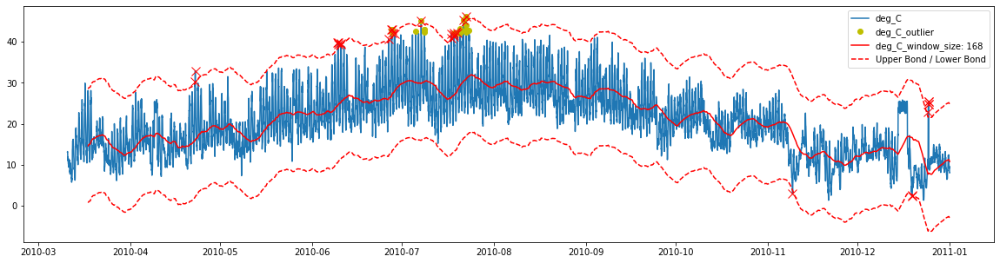

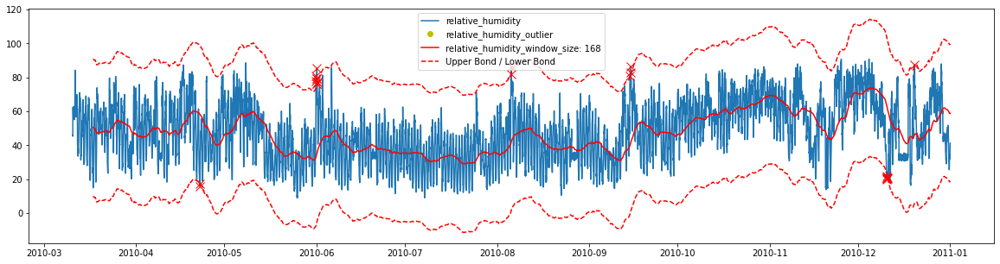

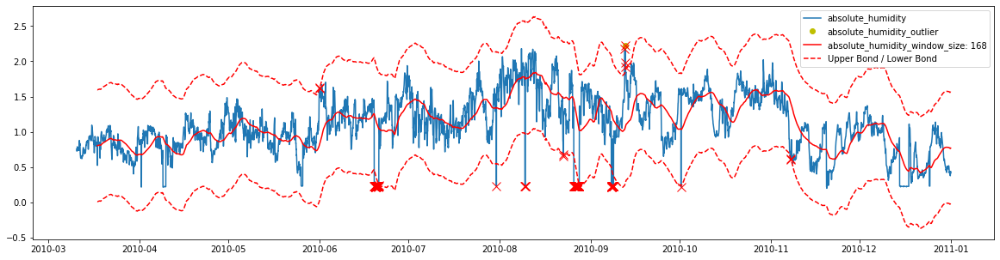

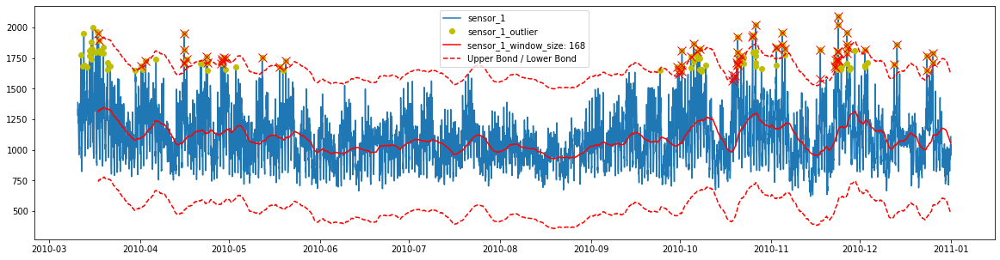

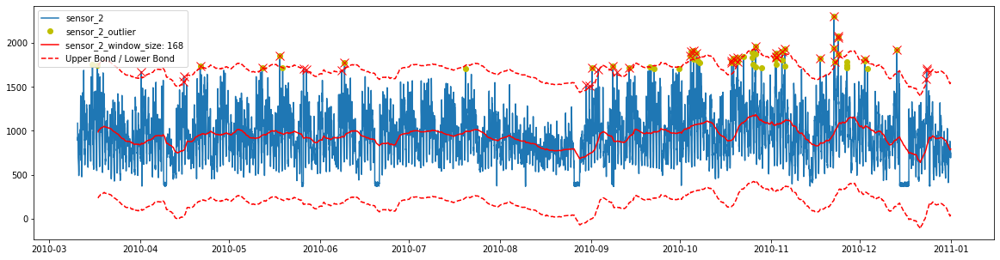

...

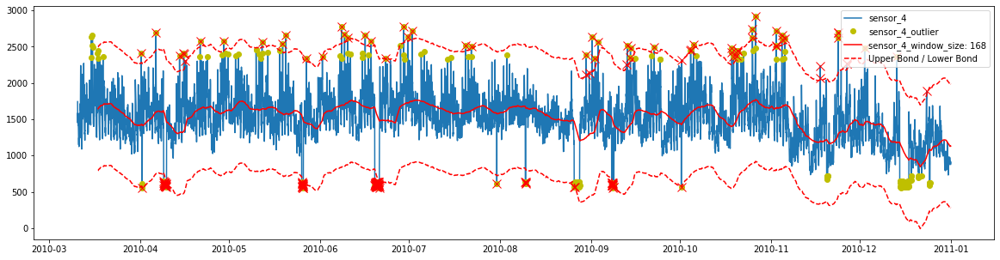

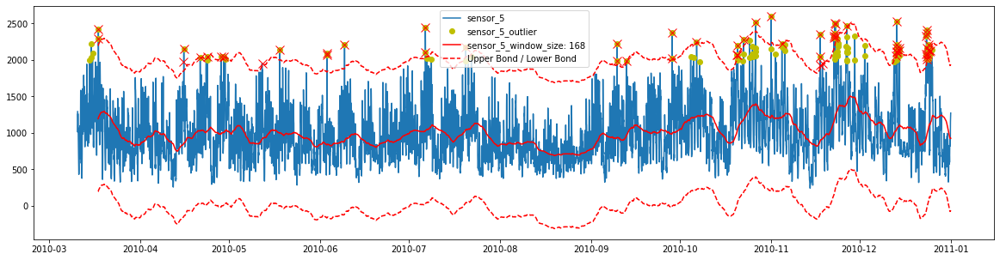

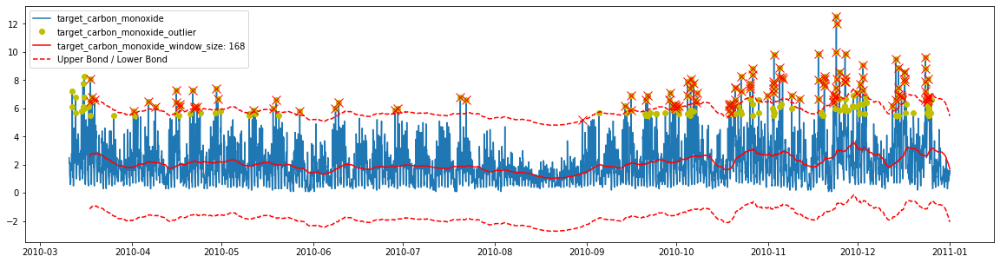

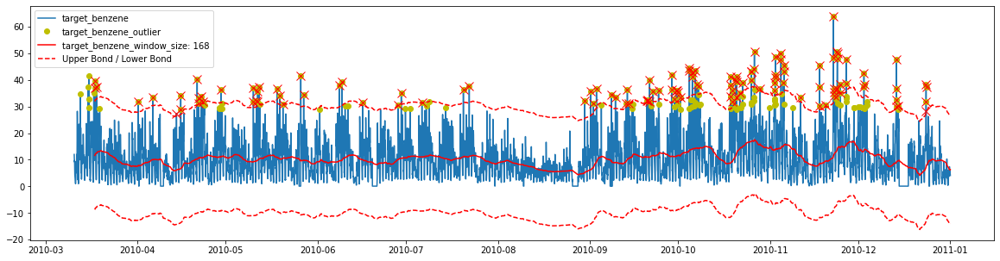

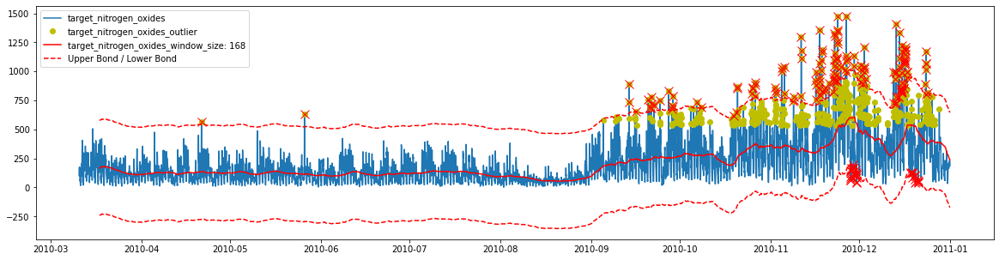

In [58]:
show_outliers(df = df, targets = columns[1:12], outliers = outliers ,n = 168, scale = 1.96)
